# *In The Name Of God*

In [1]:
!pip install kaggle
!mkdir ~/.kaggle
!touch ~/.kaggle/kaggle.json

In [2]:
api_token = {"username":"mpyahyazadeh","key":"e7185a8edfd31216e4aa7f59e82701cb"}

import json

with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)

!chmod 600 ~/.kaggle/kaggle.json

In [3]:
!kaggle datasets download -d jehanbhathena/weather-dataset

Dataset URL: https://www.kaggle.com/datasets/jehanbhathena/weather-dataset
License(s): CC0-1.0


In [4]:
!unzip /content/weather-dataset.zip -d data

Streaming output truncated to the last 5000 lines.
  inflating: data/dataset/frost/3913.jpg  
  inflating: data/dataset/frost/3914.jpg  
  inflating: data/dataset/frost/3915.jpg  
  inflating: data/dataset/frost/3916.jpg  
  inflating: data/dataset/frost/3917.jpg  
  inflating: data/dataset/frost/3918.jpg  
  inflating: data/dataset/frost/3919.jpg  
  inflating: data/dataset/frost/3920.jpg  
  inflating: data/dataset/frost/3921.jpg  
  inflating: data/dataset/frost/3922.jpg  
  inflating: data/dataset/frost/3923.jpg  
  inflating: data/dataset/frost/3924.jpg  
  inflating: data/dataset/frost/3925.jpg  
  inflating: data/dataset/frost/3926.jpg  
  inflating: data/dataset/frost/3927.jpg  
  inflating: data/dataset/frost/3928.jpg  
  inflating: data/dataset/frost/3929.jpg  
  inflating: data/dataset/frost/3930.jpg  
  inflating: data/dataset/frost/3931.jpg  
  inflating: data/dataset/frost/3932.jpg  
  inflating: data/dataset/frost/3933.jpg  
  inflating: data/dataset/frost/3934.jpg  
  i

# *Preproccesing and Visualization*

In [5]:
import os
import random
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [6]:
# Path to the new chess dataset
dir1 = "/content/data/dataset"

# Detect class folders (each representing a chess piece)
detection = [class_name for class_name in os.listdir(dir1) if os.path.isdir(os.path.join(dir1, class_name))]

print(detection)

['frost', 'hail', 'sandstorm', 'snow', 'lightning', 'fogsmog', 'rime', 'dew', 'rain', 'glaze', 'rainbow']


11 classes

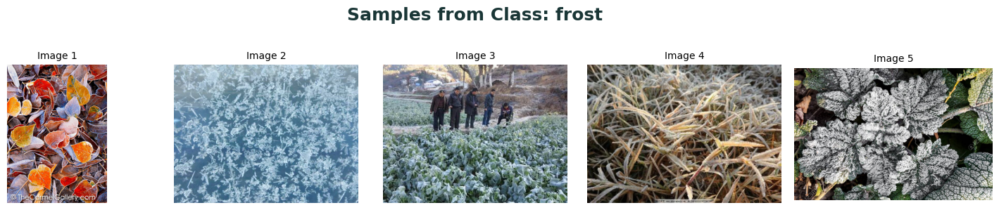

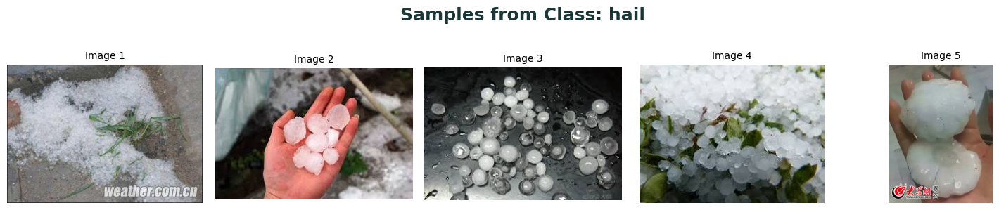

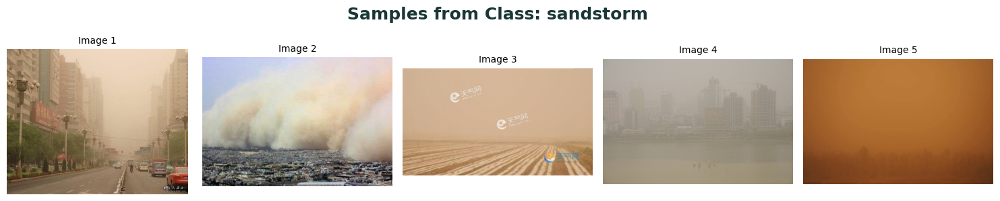

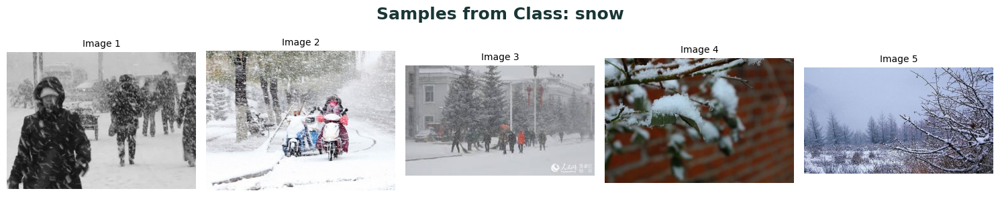

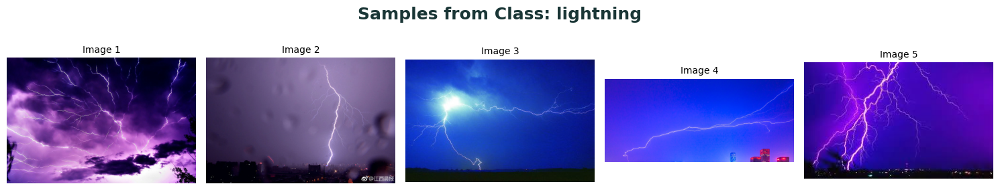

...

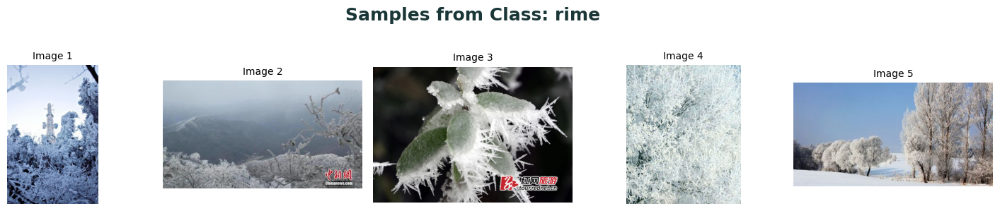

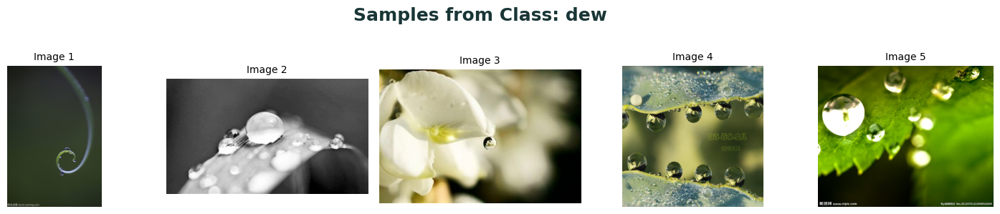

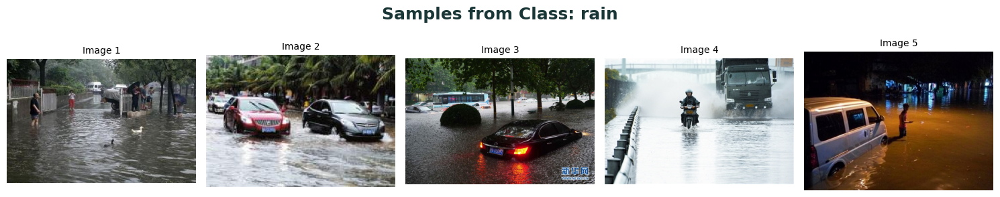

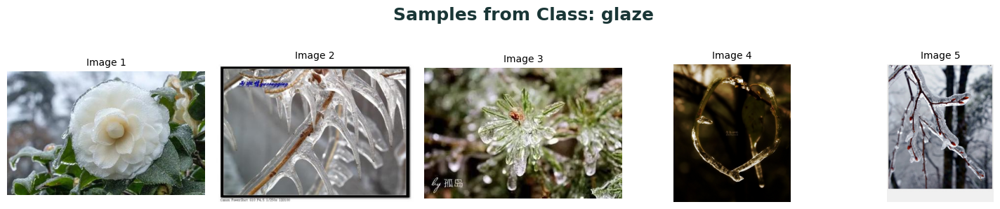

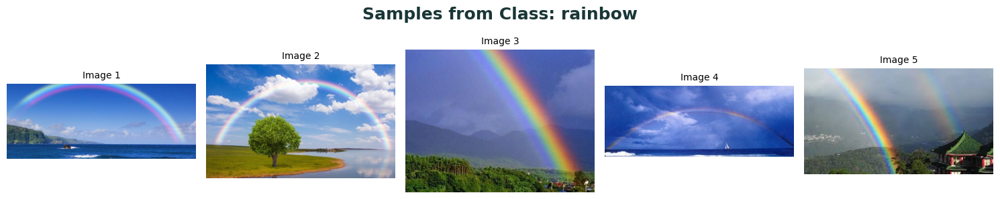

In [7]:
# Plot and Count Images
for class_name in detection:
    # Prepare class path
    class_path = os.path.join(dir1, class_name)
    # List images
    images = os.listdir(class_path)
    random_images = random.choices(images, k=5)

    # Create a figure with improved aesthetics
    fig, ax = plt.subplots(1, 5, figsize=(15, 3))
    plt.suptitle(f'Samples from Class: {class_name}', fontsize=18, fontweight='bold', color='#1A3636')

    for i in range(5):
        # Load and display the image
        img_path = os.path.join(class_path, random_images[i])
        img = keras.utils.load_img(img_path)
        ax[i].imshow(img)
        ax[i].axis('off')  # Remove axis

        # Optionally, add image title
        ax[i].set_title(f'Image {i + 1}', fontsize=10)

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()  # Display the figure

In [8]:
# Path to the dataset
dir1 = "/content/data/dataset"

# Dictionary to hold image counts per class
class_image_counts = {}

# Loop through each class folder
for class_name in os.listdir(dir1):
    class_path = os.path.join(dir1, class_name)
    if os.path.isdir(class_path):
        # Count only files (assuming all are images)
        image_count = len([
            file for file in os.listdir(class_path)
            if os.path.isfile(os.path.join(class_path, file))
        ])
        class_image_counts[class_name] = image_count

# Print the results
for class_name, count in class_image_counts.items():
    print(f"{class_name}: {count} images")

frost: 475 images
hail: 591 images
sandstorm: 692 images
snow: 621 images
lightning: 377 images
fogsmog: 851 images
rime: 1160 images
dew: 698 images
rain: 526 images
glaze: 639 images
rainbow: 232 images


In [9]:
from collections import Counter
from PIL import Image # Importing the Image module from PIL

image_shapes = []

for class_name in os.listdir(dir1):
    class_path = os.path.join(dir1, class_name)
    if not os.path.isdir(class_path): continue
    for img_file in os.listdir(class_path):
        if img_file.endswith(('.jpg', '.png', '.jpeg')):
            img = Image.open(os.path.join(class_path, img_file))
            image_shapes.append(img.size)

shape_counts = Counter(image_shapes)
print("Image shapes and their counts:")
for shape, count in shape_counts.items():
    print(f"{shape}: {count}")

Image shapes and their counts:
(700, 497): 1
(852, 480): 2
(600, 402): 1
(1920, 1080): 15
(1024, 400): 1
(626, 417): 1
(779, 516): 1
(500, 375): 24
(850, 566): 7
(400, 252): 22
(1024, 768): 48
(1024, 1024): 6
(550, 550): 2
(1300, 1209): 1
(1024, 1259): 1
(900, 675): 3
(400, 300): 449
(752, 501): 2
(1136, 2000): 1
(750, 351): 1
(680, 510): 1
(902, 604): 5
(1300, 957): 3
(300, 225): 9
(1200, 962): 1
(790, 527): 1
(606, 907): 1
(750, 563): 1
(906, 510): 2
(400, 280): 57
(600, 300): 1
(275, 183): 85
(720, 475): 1
(870, 578): 1
(846, 564): 1
(490, 367): 1
(1292, 867): 1
(765, 510): 2
(509, 740): 1
(863, 414): 1
(800, 533): 8
(1000, 667): 7
(451, 310): 2
(1490, 721): 1
(1200, 797): 4
(550, 462): 1
(450, 317): 2
(600, 360): 2
(799, 394): 1
(681, 771): 1
(3264, 2448): 2
(500, 749): 1
(1200, 800): 52
(960, 540): 1
(765, 550): 1
(259, 194): 43
(550, 412): 8
(365, 369): 1
(479, 720): 1
(670, 502): 1
(762, 508): 1
(820, 512): 8
(1280, 960): 8
(807, 538): 1
(1045, 588): 1
(1332, 850): 1
(615, 513):

## *Resize Images to same Size*

In [10]:
from PIL import Image
import os
from tqdm import tqdm

# === CONFIG ===
SRC_DIR = "/content/data/dataset"  # original folder
DEST_DIR = "/weather_resized"        # save resized here
TARGET_SIZE = (224, 224)

# === CREATE DESTINATION FOLDERS ===
for class_name in os.listdir(SRC_DIR):
    class_path = os.path.join(SRC_DIR, class_name)
    if not os.path.isdir(class_path):
        continue
    dest_class_path = os.path.join(DEST_DIR, class_name)
    os.makedirs(dest_class_path, exist_ok=True)

    # === PROCESS EACH IMAGE ===
    for img_file in tqdm(os.listdir(class_path), desc=f"Resizing {class_name}"):
        if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            src_img_path = os.path.join(class_path, img_file)
            dest_img_path = os.path.join(dest_class_path, img_file)

            try:
                img = Image.open(src_img_path).convert("RGB")
                img = img.resize(TARGET_SIZE)
                img.save(dest_img_path)
            except Exception as e:
                print(f"❌ Error resizing {src_img_path}: {e}")


Resizing rainbow: 100%|██████████| 232/232 [00:01<00:00, 197.94it/s]


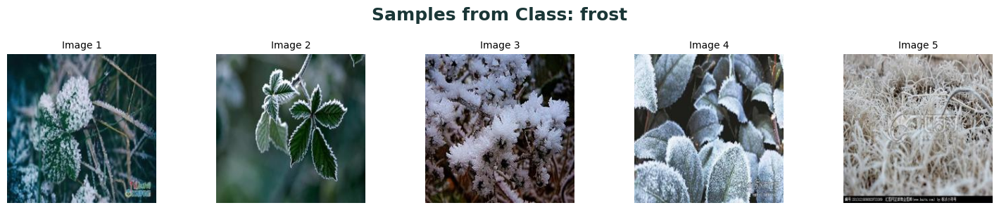

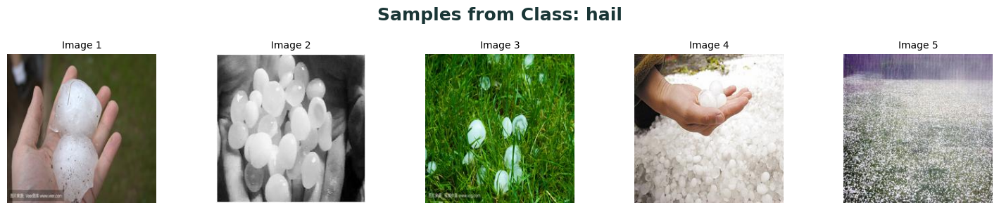

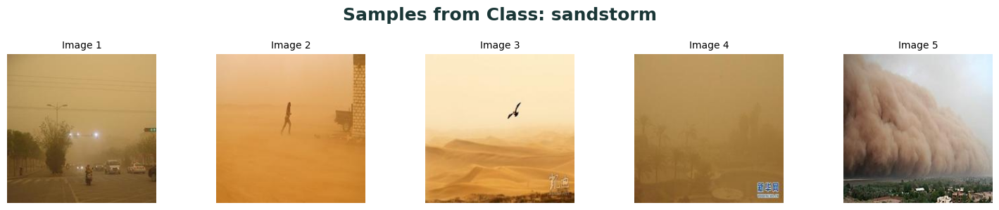

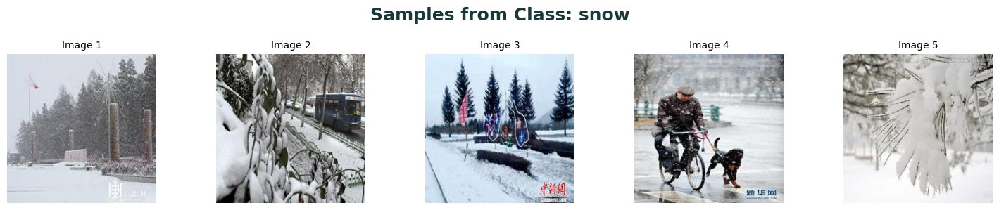

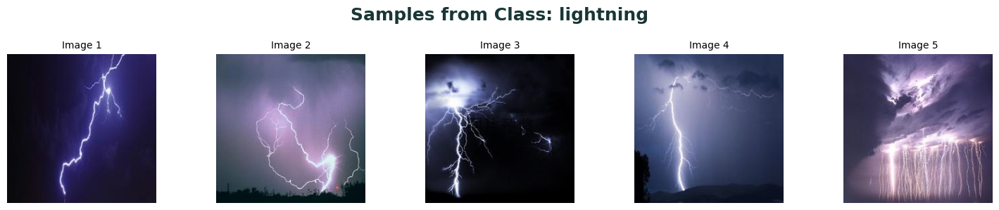

...

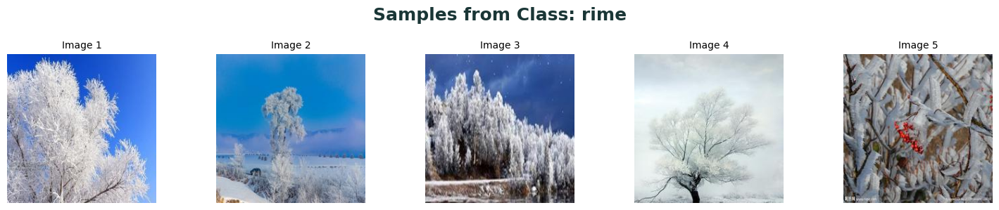

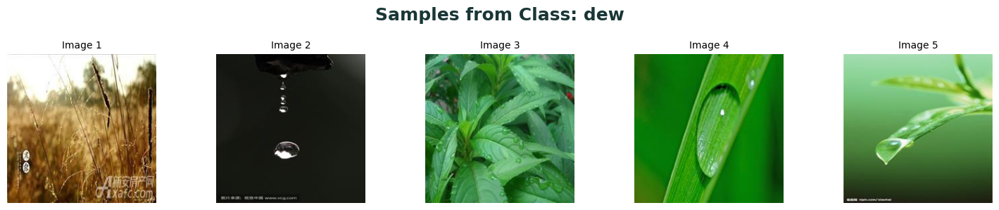

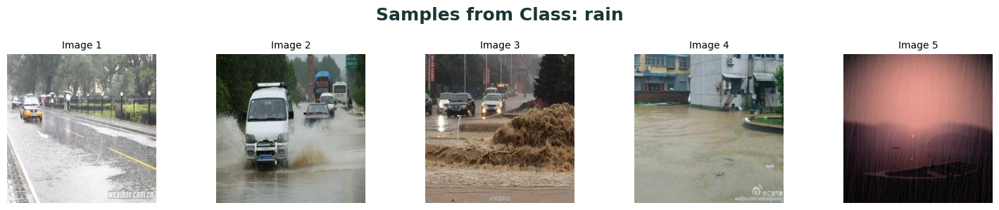

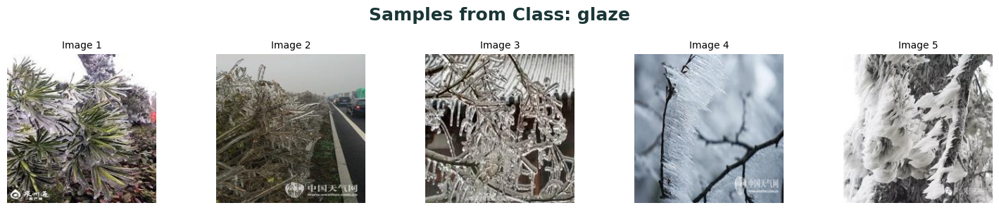

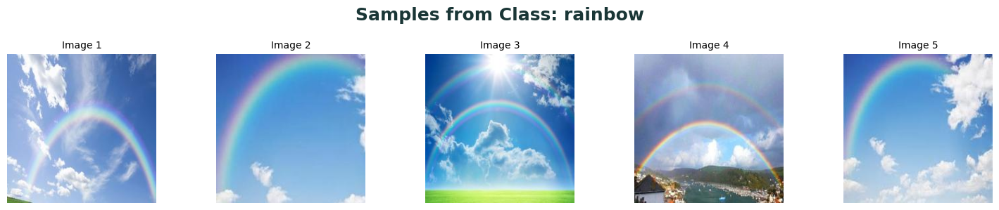

In [11]:
dir2 = "/weather_resized"

# Detect class folders (each representing a chess piece)
detection = [class_name for class_name in os.listdir(dir2) if os.path.isdir(os.path.join(dir2, class_name))]

# Plot and Count Images
for class_name in detection:
    # Prepare class path
    class_path = os.path.join(dir2, class_name)
    # List images
    images = os.listdir(class_path)
    random_images = random.choices(images, k=5)

    # Create a figure with improved aesthetics
    fig, ax = plt.subplots(1, 5, figsize=(15, 3))
    plt.suptitle(f'Samples from Class: {class_name}', fontsize=18, fontweight='bold', color='#1A3636')

    for i in range(5):
        # Load and display the image
        img_path = os.path.join(class_path, random_images[i])
        img = keras.utils.load_img(img_path)
        ax[i].imshow(img)
        ax[i].axis('off')  # Remove axis

        # Optionally, add image title
        ax[i].set_title(f'Image {i + 1}', fontsize=10)

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()  # Display the figure

In [12]:
from collections import Counter
from PIL import Image # Importing the Image module from PIL

image_shapes = []

for class_name in os.listdir(dir2):
    class_path = os.path.join(dir2, class_name)
    if not os.path.isdir(class_path): continue
    for img_file in os.listdir(class_path):
        if img_file.endswith(('.jpg', '.png', '.jpeg')):
            img = Image.open(os.path.join(class_path, img_file))
            image_shapes.append(img.size)

shape_counts = Counter(image_shapes)
print("Image shapes and their counts:")
for shape, count in shape_counts.items():
    print(f"{shape}: {count}")

Image shapes and their counts:
(224, 224): 6862


# *Data Augmentation With Tensorflow_Keras & Split*

In [13]:
import tensorflow as tf
import os
import random
from tensorflow.keras import layers

# Dataset path
data_dir = "/weather_resized"

# Parameters
img_size = (224, 224)
batch_size = 32
seed = 42

# Define augmentation pipeline (rescaling last!)
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.05),
    layers.RandomZoom(0.05),
    layers.RandomTranslation(0.05, 0.05),
    layers.RandomBrightness(factor=0.2),
    layers.Rescaling(1./255)  # Normalize after augmentation
])

# Get all image paths
all_image_paths = []
class_names = sorted(os.listdir(data_dir))

for class_name in class_names:
    class_path = os.path.join(data_dir, class_name)
    if os.path.isdir(class_path):
        for fname in os.listdir(class_path):
            if fname.lower().endswith(('.jpg', '.png', '.jpeg')):
                all_image_paths.append(os.path.join(class_path, fname))

# Shuffle and split
random.seed(seed)
random.shuffle(all_image_paths)

total = len(all_image_paths)
train_count = int(0.8 * total)
val_count = int(0.1 * total)

train_paths = all_image_paths[:train_count]
val_paths = all_image_paths[train_count:train_count + val_count]
test_paths = all_image_paths[train_count + val_count:]

# Get label from path
def get_label(file_path):
    return tf.strings.split(file_path, os.path.sep)[-2]

# Decode image only (no normalization here)
def decode_img(file_path):
    label = get_label(file_path)
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, img_size)
    return img, label


# Prepare dataset and apply augmentation only to training
def prepare_dataset(file_paths, augment=False):
    ds = tf.data.Dataset.from_tensor_slices(file_paths)
    ds = ds.map(decode_img, num_parallel_calls=tf.data.AUTOTUNE)
    if augment:
        ds = ds.map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=tf.data.AUTOTUNE)
    else:
        ds = ds.map(lambda x, y: (layers.Rescaling(1./255)(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.shuffle(buffer_size=1000)

    # Convert string labels to numerical using class_names
    def to_numerical_labels(image, label):
        return image, tf.argmax(label == class_names)

    ds = ds.map(to_numerical_labels)  # Add this line

    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

# Create datasets
train_ds = prepare_dataset(train_paths, augment=True)
val_ds = prepare_dataset(val_paths)
test_ds = prepare_dataset(test_paths)

In [14]:
len(train_ds), len(val_ds), len(test_ds)

(172, 22, 22)

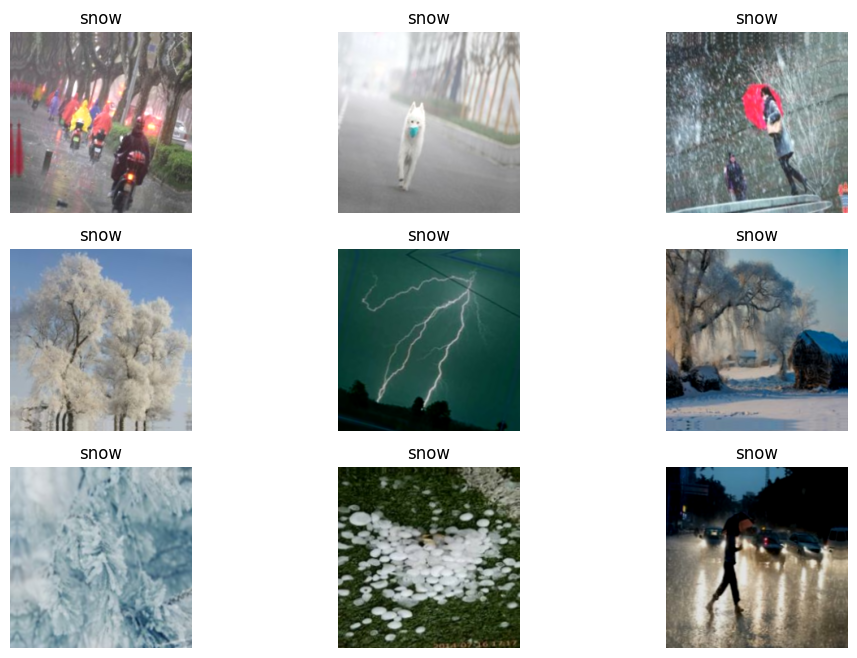

In [15]:
import matplotlib.pyplot as plt

# Get a batch from the dataset
class_names = sorted(os.listdir(data_dir))  # ensure labels are ordered
for images, labels in train_ds.take(1):
    plt.figure(figsize=(12, 8))
    for i in range(9):  # show 9 images
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy())

        # Get the class name as a string
        # class_name = labels[i].numpy().decode('utf-8')

        # Find the index of the class name in the class_names list
        class_index = class_names.index(class_name)

        plt.title(class_names[class_index]) # Use the index to access the class name
        plt.axis("off")
    break
plt.show()

In [16]:
IMG_SIZE = (224, 224)

# *Custom Model With Hyperparameters Tuning *

In [31]:
def create_model(filters=32, dropout_rate=0.3, dense_units=128, learning_rate=1e-3):
    # Get the number of classes from the dataset (assuming you've done this before)
    num_classes = len(class_names) # class_names should be defined and contain your labels

    model = models.Sequential([
        layers.Conv2D(filters, 3, activation='relu', input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)),
        layers.MaxPooling2D(),
        layers.Conv2D(filters*2, 3, activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(filters*2, 3, activation='relu'),
        layers.MaxPooling2D(),
        layers.Flatten(),
        layers.Dense(dense_units, activation='relu'),
        layers.Dropout(dropout_rate),
        layers.Dense(num_classes, activation='softmax') # Use num_classes here
    ])
    model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])


    return model

In [18]:
!pip install -q keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 4.6 MB/s eta 0:00:00


In [19]:
import keras_tuner as kt
from tensorflow.keras import layers, models

In [33]:
def model_builder(hp):
    filters = hp.Choice('filters', [32, 64])
    dense_units = hp.Int('dense_units', 64, 256, step=64)
    dropout_rate = hp.Float('dropout_rate', 0.2, 0.5, step=0.1)
    learning_rate = hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])
    return create_model(filters, dropout_rate, dense_units, learning_rate)

tuner = kt.RandomSearch(
    model_builder,
    objective='val_accuracy',
    max_trials=5,
    executions_per_trial=1,
    directory='/working/tuner_logs',
    project_name='weather_cnn'
)

tuner.search(train_ds, validation_data=val_ds, epochs=3)

# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]
best_model.summary()

Trial 5 Complete [00h 05m 37s]
val_accuracy: 0.5976676344871521

Best val_accuracy So Far: 0.6413994431495667
Total elapsed time: 00h 27m 14s


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 43264)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     5,537,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,595,659 (21.35 MB)

 Trainable params: 5,595,659 (21.35 MB)

 Non-trainable params: 0 (0.00 B)

In [35]:
history = best_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)
    ]
)

Epoch 1/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 81s 382ms/step - accuracy: 0.6375 - loss: 1.0856 - val_accuracy: 0.5977 - val_loss: 1.1291
Epoch 2/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 76s 365ms/step - accuracy: 0.6379 - loss: 1.0495 - val_accuracy: 0.6749 - val_loss: 0.9998
Epoch 3/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 77s 374ms/step - accuracy: 0.6559 - loss: 1.0246 - val_accuracy: 0.6545 - val_loss: 0.9646
Epoch 4/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 83s 384ms/step - accuracy: 0.6571 - loss: 1.0184 - val_accuracy: 0.6574 - val_loss: 0.9560
Epoch 5/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 78s 377ms/step - accuracy: 0.6836 - loss: 0.9252 - val_accuracy: 0.7070 - val_loss: 0.8838
Epoch 6/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 78s 377ms/step - accuracy: 0.6962 - loss: 0.8861 - val_accuracy: 0.6924 - val_loss: 0.9158
Epoch 7/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 78s 377ms/step - accuracy: 0.7069 - loss: 0.8856 - val_accuracy: 0.7143 - val_loss: 0.8275
Epoch 8/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 77s 372ms/step - accuracy: 0.7128 - loss: 0

# *Evaluate and Test Pretrained Model*

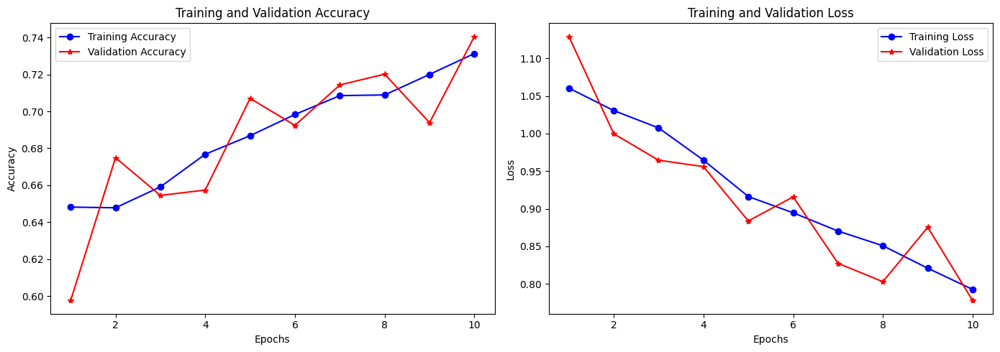

In [36]:
import matplotlib.pyplot as plt

def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

    # Accuracy Plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo-', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'r*-', label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss Plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'r*-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Call it after model.fit()
plot_history(history)

In [37]:
# Evaluate the model
test_loss, test_acc = best_model.evaluate(val_ds)
print(f"\n✅ Test Accuracy: {test_acc:.4f}")
print(f"🧪 Test Loss: {test_loss:.4f}")

22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.7100 - loss: 0.8660

✅ Test Accuracy: 0.7405
🧪 Test Loss: 0.7780


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step

📊 Classification Report:
              precision    recall  f1-score   support

         dew       0.90      0.80      0.85        65
     fogsmog       

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


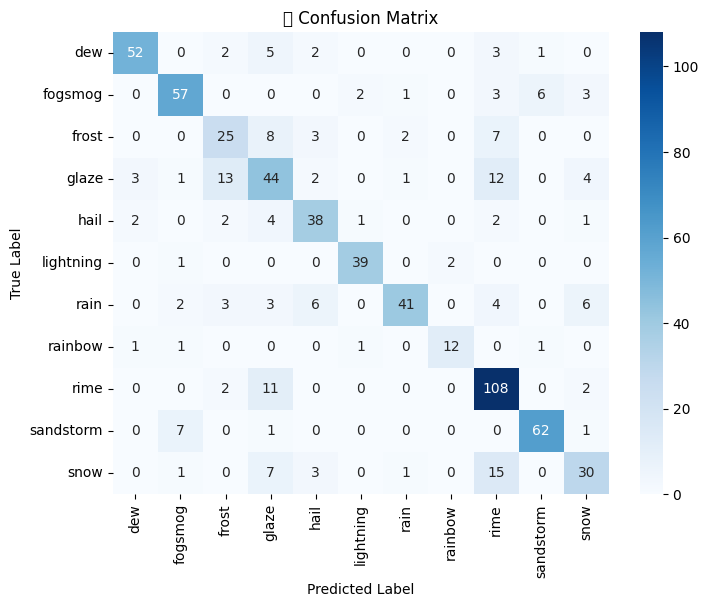

In [51]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Get true labels and predicted labels
y_true = []
y_pred = []

#Instead of using val_ds.class_names, directly use class_names
#This variable is already defined in the current session
#Referencing the global variable with the class names instead of trying to access it from the dataset object

# class_names = val_ds.class_names  <-- Remove or comment out this line

for images, labels in val_ds:
    preds = best_model.predict(images)
    # The labels are already numerical, so no need for argmax
    y_true.extend(labels.numpy()) # Change this line
    y_pred.extend(np.argmax(preds, axis=1))

# Report
print("\n📊 Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title("🔍 Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


<ipython-input-48-0ba04298250f>:18: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


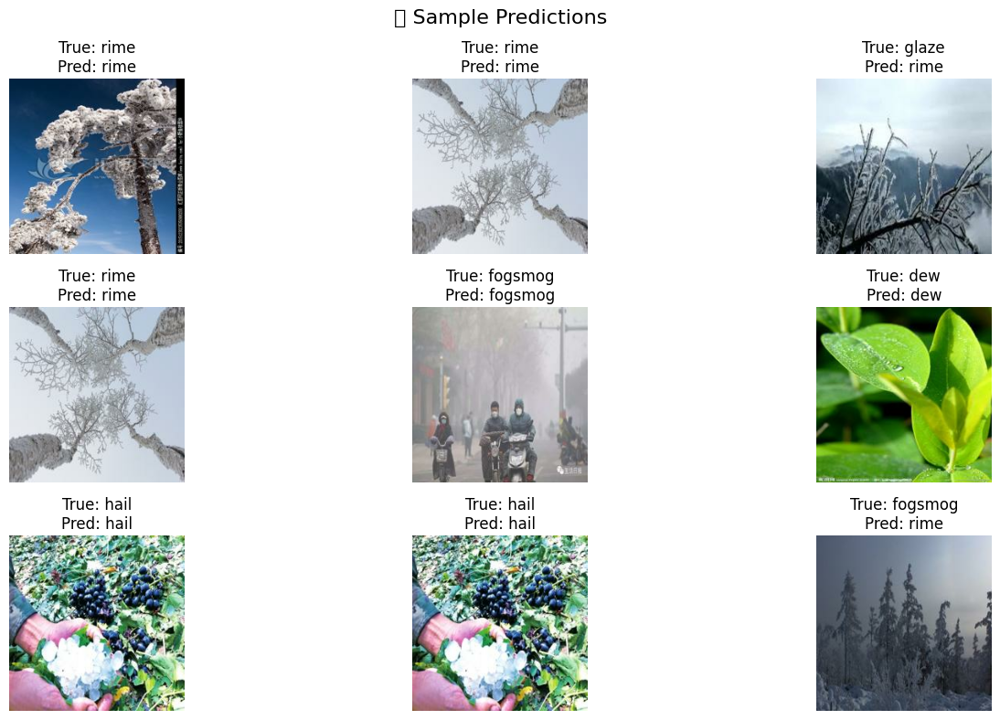

In [48]:
import random

# Get one batch from the validation set
for images, labels in val_ds.take(1):
    preds = best_model.predict(images)
    pred_labels = tf.argmax(preds, axis=1)
    # The labels are already numerical, so no need for argmax
    true_labels = labels  # Change this line

    plt.figure(figsize=(15, 8))
    for i in range(9):
        idx = random.randint(0, len(images) - 1)
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[idx].numpy())
        plt.title(f"True: {class_names[true_labels[idx]]}\nPred: {class_names[pred_labels[idx]]}")
        plt.axis("off")
    plt.suptitle("🔍 Sample Predictions", fontsize=16)
    plt.tight_layout()
    plt.show()

## *Modeling : Pretrained MobileNetV2*

In [41]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Number of classes
num_classes = len(class_names)

# Pretrained base model (without top/classification head)
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False  # Freeze the base

# Build the full model
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(num_classes, activation='softmax')
])

# Compile the model
model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='sparse_categorical_crossentropy',  # use sparse if labels are integer-encoded
    metrics=['accuracy']
)

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,423,371 (9.24 MB)

 Trainable params: 165,387 (646.04 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [42]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10
)

Epoch 1/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 98s 439ms/step - accuracy: 0.4962 - loss: 1.4824 - val_accuracy: 0.7289 - val_loss: 0.7605
Epoch 2/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 126s 368ms/step - accuracy: 0.7257 - loss: 0.7465 - val_accuracy: 0.7434 - val_loss: 0.7024
Epoch 3/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 76s 365ms/step - accuracy: 0.7599 - loss: 0.6782 - val_accuracy: 0.7376 - val_loss: 0.7174
Epoch 4/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 81s 356ms/step - accuracy: 0.7809 - loss: 0.6031 - val_accuracy: 0.7697 - val_loss: 0.6187
Epoch 5/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 73s 348ms/step - accuracy: 0.7942 - loss: 0.5653 - val_accuracy: 0.7551 - val_loss: 0.6645
Epoch 6/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 72s 347ms/step - accuracy: 0.8043 - loss: 0.5295 - val_accuracy: 0.7638 - val_loss: 0.6409
Epoch 7/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 83s 353ms/step - accuracy: 0.8089 - loss: 0.5319 - val_accuracy: 0.7755 - val_loss: 0.5932
Epoch 8/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 72s 349ms/step - accuracy: 0.8190 - loss: 

<ipython-input-43-913e4705c6b3>:29: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-43-913e4705c6b3>:29: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


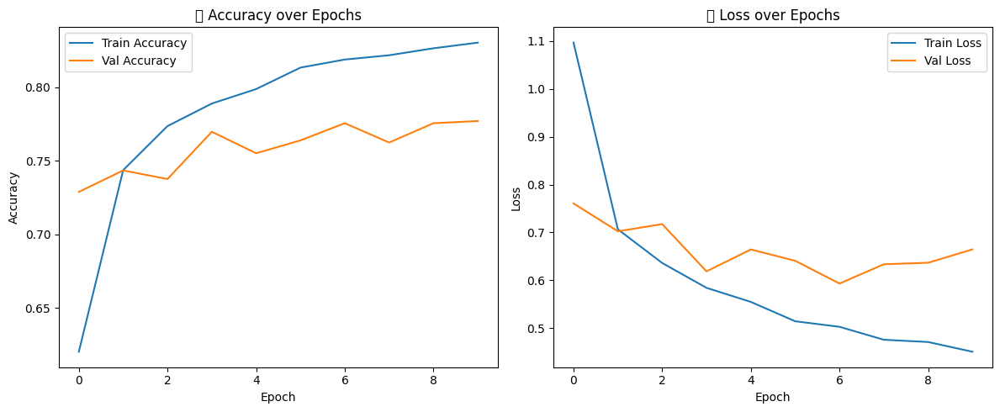

In [43]:
# Extract values
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(len(acc))

# Plotting
plt.figure(figsize=(12, 5))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Train Accuracy')
plt.plot(epochs_range, val_acc, label='Val Accuracy')
plt.title('📈 Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Train Loss')
plt.plot(epochs_range, val_loss, label='Val Loss')
plt.title('📉 Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [45]:
val_loss, val_acc = model.evaluate(val_ds)
print(f"Validation Accuracy: {val_acc:.4f}, Loss: {val_loss:.4f}")

22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.8013 - loss: 0.6002
Validation Accuracy: 0.7770, Loss: 0.6646


In [46]:
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test Accuracy: {test_acc:.4f}, Loss: {test_loss:.4f}")

22/22 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - accuracy: 0.8138 - loss: 0.5541
Test Accuracy: 0.8108, Loss: 0.5581


In [47]:
from sklearn.metrics import classification_report
import numpy as np

y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    preds = tf.argmax(preds, axis=1)
    y_true.extend(labels.numpy())
    y_pred.extend(preds.numpy())

print(classification_report(y_true, y_pred, target_names=class_names))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 56s 56s/step
              precision    recall  f1-score   support

         dew       0.91      0.95      0.93        76
     fogsmog       0.72      0.91      0.80        81

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


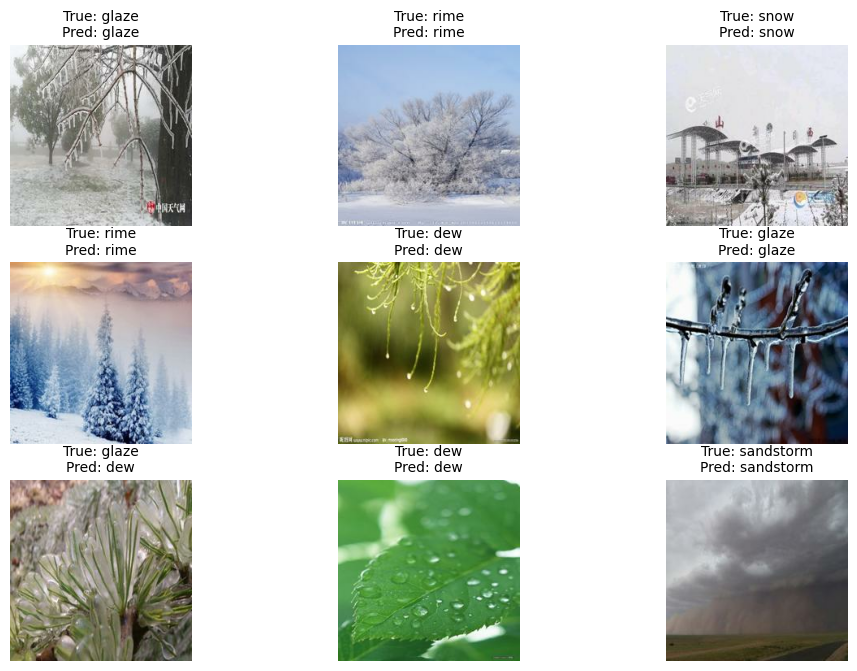

In [44]:
for images, labels in test_ds.take(1):
    preds = model.predict(images)
    pred_labels = tf.argmax(preds, axis=1)

    plt.figure(figsize=(12, 8))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy())
        true_lbl = class_names[int(labels[i])]
        pred_lbl = class_names[int(pred_labels[i])]
        plt.title(f"True: {true_lbl}\nPred: {pred_lbl}", fontsize=10)
        plt.axis("off")

# *Roc_Curve*

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


<ipython-input-54-601fe451a676>:43: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


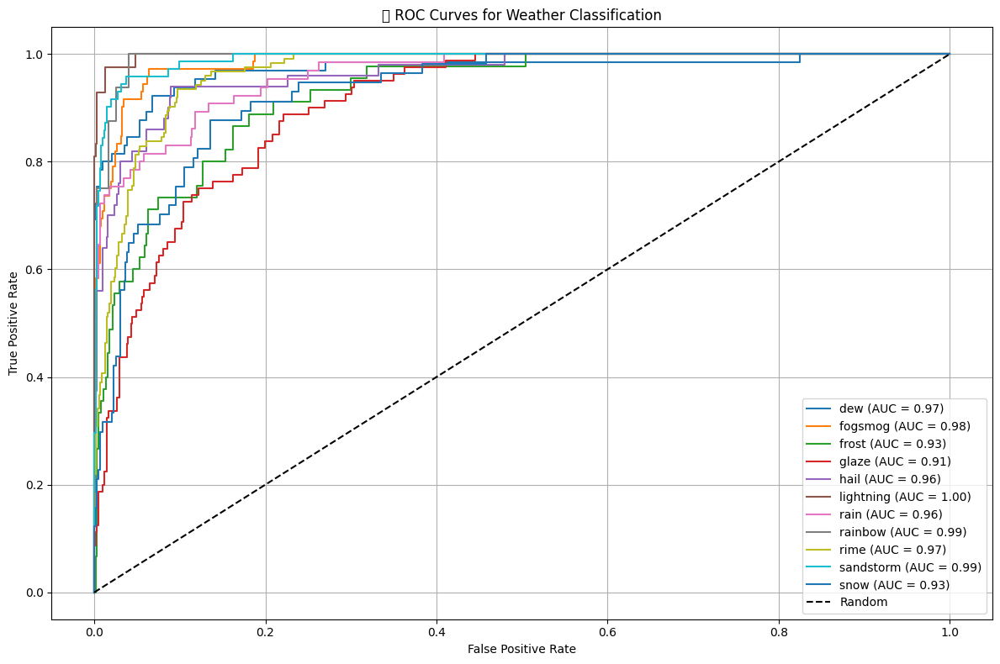

In [54]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

#Instead of using val_ds.class_names, directly use class_names
#This variable is already defined in the current session
#Referencing the global variable with the class names instead of trying to access it from the dataset object

# class_names = val_ds.class_names  <-- Remove or comment out this line
num_classes = len(class_names)

# Prepare true labels and predicted probabilities
y_true = []
y_probs = []

for images, labels in val_ds:
    probs = best_model.predict(images)
    y_probs.extend(probs)
    y_true.extend(labels.numpy())  # Sparse labels (integers)

# Convert to NumPy arrays
y_true = np.array(y_true)
y_probs = np.array(y_probs)

# Binarize the labels for ROC
y_true_bin = label_binarize(y_true, classes=list(range(num_classes)))

# Plot ROC curve for each class
plt.figure(figsize=(12, 8))

for i in range(num_classes):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.title("📈 ROC Curves for Weather Classification")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

Each curve shows the tradeoff between TPR and FPR for one class.

AUC close to 1.0 → great performance; close to 0.5 → model is guessing.

Grad_cam & Top_N